## PW on graphcut optimization (binary case)
This session is divided into 3 parts:


* a part on Bayesian classification (see PW1 and PW2)
* a part on object/background segmentation of a colour image with a CRF (conditional random filed)
* a part on the iterative segmentation of a textured image

We will use the PyMaxflow library for the calculation of the graphcut.

In [1]:
import math
import random
import numpy as np
import matplotlib.pyplot as plt

import platform
import tempfile
import os
from scipy import ndimage as ndi
try:
    import maxflow # if not installed, install Maxflow
except:
    !pip install PyMaxflow # For Google Collab
    import maxflow

from skimage import io
from bokeh.plotting import figure, output_file, show
from bokeh.plotting import show as showbokeh
from bokeh.io import output_notebook
output_notebook()

def display_segmentation_borders(image, bin):
    imagergb = np.copy(image)
    from skimage.morphology import binary_dilation, disk
    contour = binary_dilation(bin,disk(15))^bin
    imagergb[contour==1,0] = 255
    imagergb[contour==1,1] = 0
    imagergb[contour==1,2] = 0
    return imagergb

Loading BokehJS ...

## Binary classification of a noisy image

You have a binary image *IoriginaleBW.png* (binary image of the two classes) and its observed version with a certain distribution of grey levels for each class *Iobservee.png*. The objective is to perform a two-class classification of this observed image (see PW1 and PW2).

### Analysis of the distributions of the 2 classes of the image}


Q1: What are the distributions of the two classes of the image ($P(Y_s|X_s=0)$ (black class) and $P(Y_s|X_s=1)$ (white class))?

Q2: Give the means and variances of the two classes (CF. code of Q8).

*The distributions and the means and variances found in the previous sessions will be used without justification*.

**Your answer &#x270D;**

A1: $P(Y_s \mid X_s = 0)$ and $P(Y_s \mid X_s = 1)$ follow a Gaussian distribution.

A2: $(\mu_0, \sigma_0^2) \approx (97, 493)$ and $(\mu_1, \sigma_1^2) \approx (164, 513)$

## 1.1: Graphcut optimization

Q3: How many nodes does the graph have that is constructed for the search for the minimum capacity cut with only two neighbouring pixels? What do they correspond to? What do the data attachment terms in this graph correspond to and what values do they have for two observed pixels of values $y_s$ and $y_t$? What does the regularisation term correspond to?

**Your answer &#x270D;**

A3: Let $u$ and $v$ be the two pixels considered. Then, the graph will have 4 nodes: $s$ (source), $t$ (sink), $u$ and $v$. The data attachment terms correspond to the weight of the edged $(s, u)$, $(s, v)$, $(u, t)$ and $(v, t)$, which are given below:
\begin{align*}
w(s, u) &= (y_u - \mu_0)^2 \\
w(s, v) &= (y_v - \mu_0)^2 \\
w(u, t) &= (y_u - \mu_1)^2 \\
w(v, t) &= (y_v - \mu_1)^2
\end{align*}

The regularization term corresponds to the egde $(u, v)$, whose weight is $w(u, v) = \beta$.

Q4: Complete the python code cell where it says "#TO BE COMPLETED EX1" with the data attachment and regularization terms as indicated. Run the minimum cut algorithm and view the result.

## 1.2 Searching for the optimal $\beta$.



Q5: By completing the program frame provided below, find the optimal $\beta$ value $\beta_{opt}$ using the "true image" $x$ corresponding to IoriginaleBW.png. You can plot the error values between $x$ and the estimated $\hat{x}$ to find $\beta_{opt}$.



**Your answer &#x270D;**

A5: The best regularization parameter found was $\beta_\text{opt} \approx 1776$.

Q6: What are the advantages of this optimization approach compared to ICM? Compared to simulated annealing? In theory, do we obtain the same result with both methods (simulated annealing and graphcut)? Under what conditions? What is the advantage of simulated annealing in the general case?

**Your answer &#x270D;**

A6: Using the min-cut method, we are guaranteeded to find the global minimum of the global energy whilst the ICM algorithm converges to a local minimum. Compared to simulated annealing, the min-cut algorithm converges much faster.

In theory, the result of graph-cut and simulated annealing (SA) may be different if SA does not converge to the global minimum.
In general, SA might be better visually if the Ising model is not well suited for the images considered. In other words, if the images to be classified have a lot of contours, it is not a good idea to minimize the Ising model.
Moreover, SA allows us to set $\beta < 0$, which translates to non-attractive models.


Q7: If we get different results between ICM and graph-cut, or between simulated annealing and graph-cut (if the conditions for the simulated annealing to give the global minima are not respected), how can you explain that the error rate with the true image can be lower with the ICM result of the simulated annealing one than with the graph-cut optimization?
  

**Your answer &#x270D;**

A7: If there are many contours in the image, the global minimum of the Ising model is not suited to achieve a good classification. In this sense, a local minimum might yield a better result.
This is the case with the images considered because the written number have a high amount of contours.

Q8: What are the advantages and disadvantages of the Ising model?

**Your answer &#x270D;**

A8: One great advantage of the Ising model is its simplicity. The main problem with it is that it penalizes borders too much. This translates to areas of the binary image that do not preserve well the contours present in the original image.

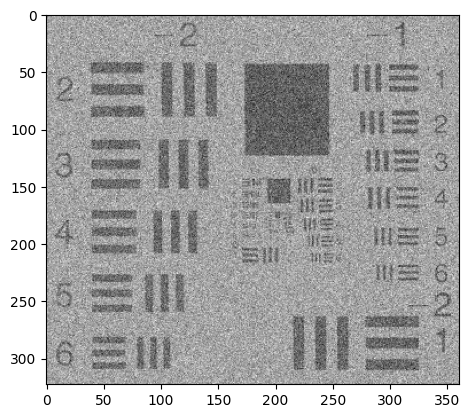

In [2]:
# Loading images
im_obs=io.imread("https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/Iobservee.png") # Observed image, noisy
im_orig=io.imread("https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/IoriginaleBW.png") # Binary reference image, to assess the quality of the segmentation

plt.imshow(im_obs,cmap='gray')

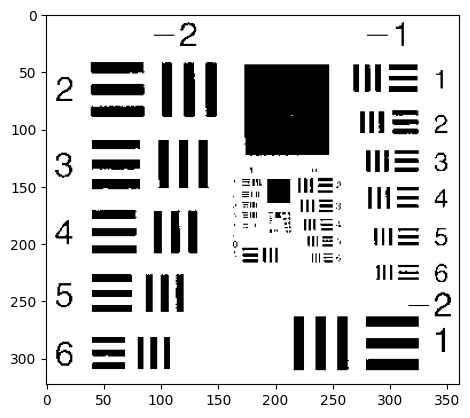

In [3]:
plt.imshow(im_orig, cmap='gray')

In [4]:
#### to be completed
# TO BE COMPLETED EX1
# /!\ beta, m0 and m1 must be floats to avoid some issues. For example: "beta = 1.".
beta =  1776.
m0 = 97.
m1 = 164.

## binary graph-cut

# Create the graph.
g = maxflow.Graph[float]() # Graph instantiation

# Add the nodes.
# nodeids has the identifiers of the nodes in the grid.
# It creates a set of nodes for all the pixels of the image
nodeids = g.add_grid_nodes(im_obs.shape)

# Add non-terminal edges with the same capacity.
# the edge has the value beta for all adjacent pixels in 4-connexity
g.add_grid_edges(nodeids, beta)

# Add the terminal edges.
# the second argument correspond to the set of edge values to the source
# the third argument correspond to the set of edge values to the sink
map_Us_0 = (im_obs - m0) ** 2
map_Us_1 = (im_obs - m1) ** 2
g.add_grid_tedges(nodeids, map_Us_0, map_Us_1)

# Find the maximum flow.
flow = g.maxflow()

print("Max Flow:", str(flow))
# Get the labels of the nodes in the grid.
# output is 0 if the node is connected to the source, else output is 1
sgm = g.get_grid_segments(nodeids)
im_bin = np.int_(np.logical_not(sgm))


Max Flow: 76404613.0


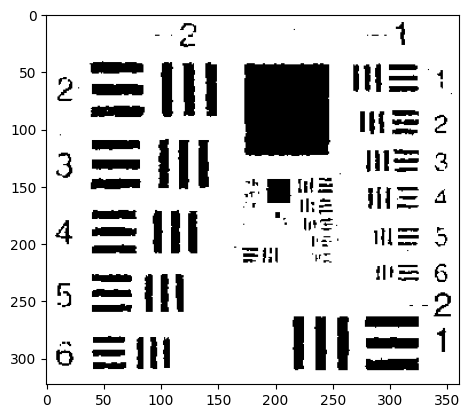

In [5]:
plt.imshow(im_bin,cmap='gray')

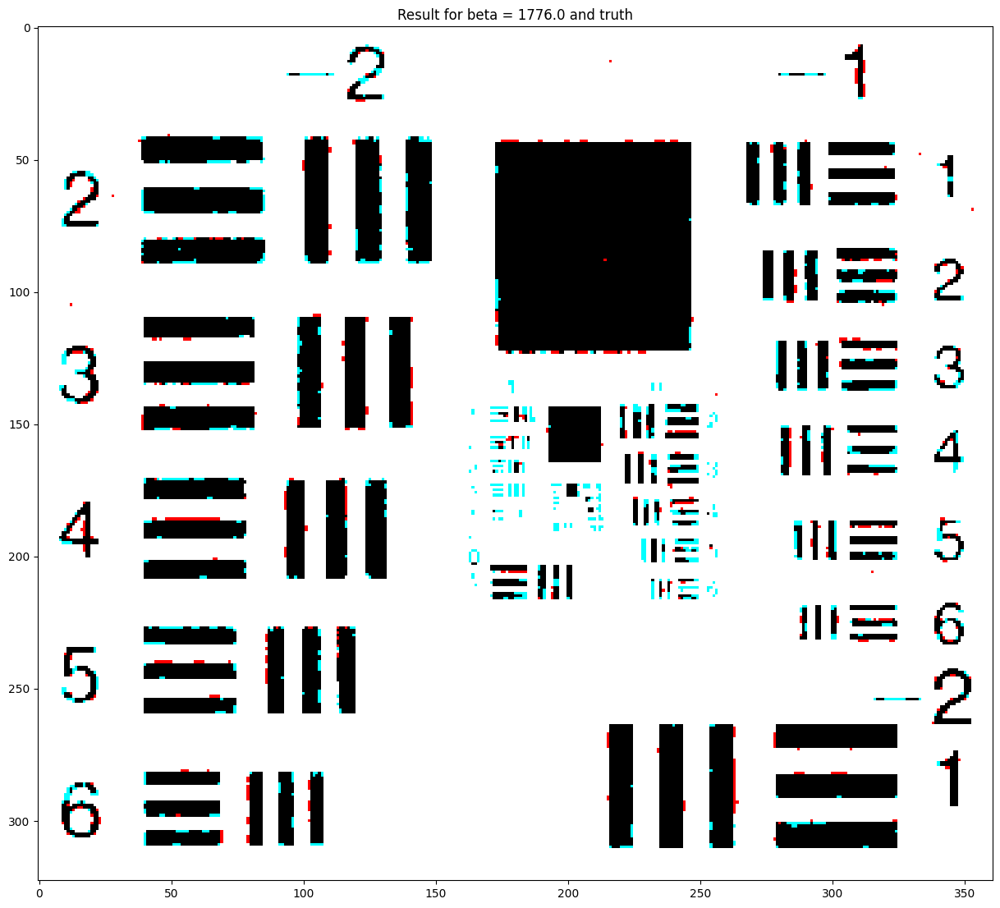

Number of misclassified pixels for beta =  1776.0 :  2185


In [6]:
# compute the error image between im_bin and im_orig (the ideal solution) using np.abs and np.sum
error = np.sum(np.abs(im_orig - im_bin))
plt.rcParams['figure.figsize'] = [15, 15]
# visualize the differences between the original image and the solution
plt.figure()
plt.imshow(np.dstack((np.int_(im_orig), im_bin, im_bin))*255)
plt.title("Result for beta = " + str(beta) + " and truth")
plt.show()

print("Number of misclassified pixels for beta = ",beta,": ",int(error))

### Search for the best parameter $\beta$

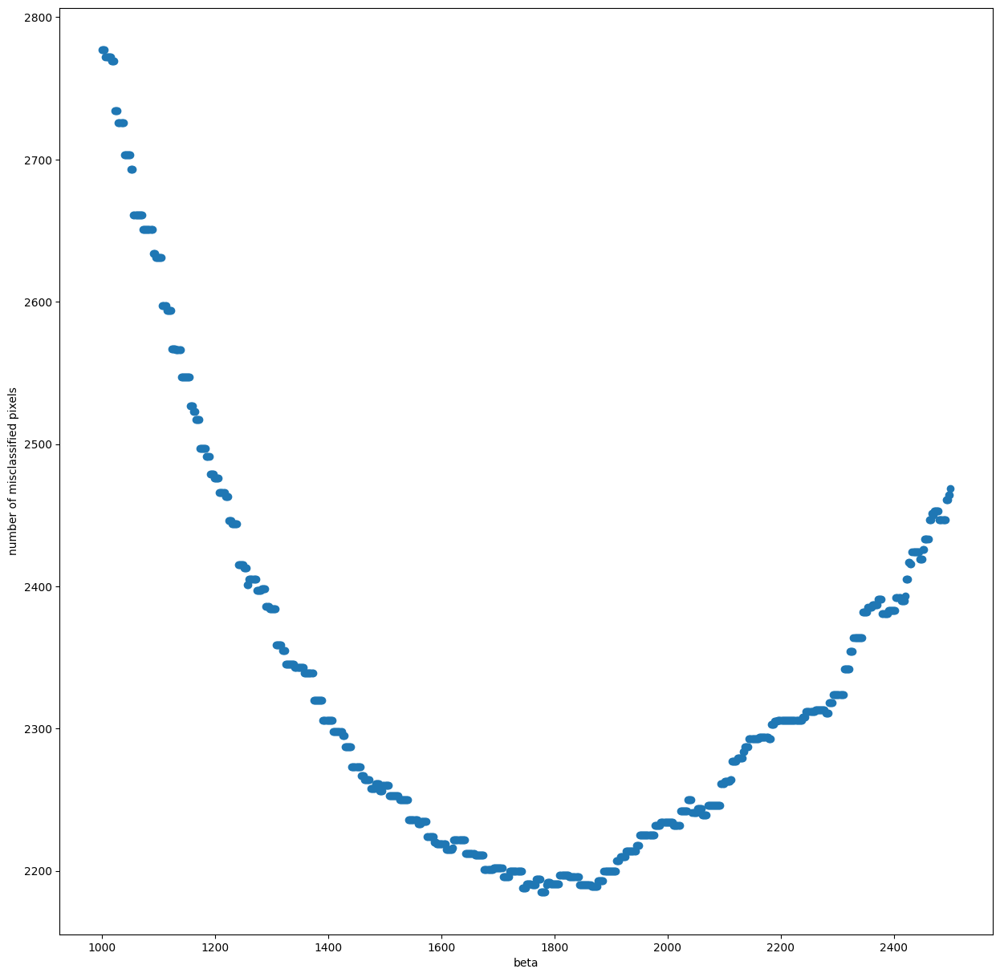

Best beta value:  1776.2762762762763


In [7]:
im_obs=io.imread("https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/Iobservee.png") # Observed image, noisy
im_orig=io.imread("https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/IoriginaleBW.png") # Binary reference image, to assess the quality of the segmentation

list_beta = []
list_errors = []

# TO BE COMPLETED - choose a range of values and a step to study beta
for beta in np.linspace(1_000, 2_500, 1_000):
    # TO BE COMPLETED
    m0 = 97.
    m1 = 164.

    ## Binary graph cut

    # Create the graph
    g = maxflow.Graph[float]() # graph instantiation

    # Add the nodes. nodeids has the identifiers of the nodes in the grid.
    nodeids = g.add_grid_nodes(im_obs.shape)
    # Add non-terminal edges with the same capacity.
    g.add_grid_edges(nodeids,beta)
    # Add the terminal edges.
    #TO BE COMPLETED
    map_Us_0 = (im_obs - m0) ** 2
    map_Us_1 = (im_obs - m1) ** 2
    g.add_grid_tedges(nodeids, map_Us_0, map_Us_1)

    # Find the maximum flow.
    flow = g.maxflow()

    # Get the segments of the nodes in the grid.
    sgm = g.get_grid_segments(nodeids)
    # create the output image
    im_bin = np.int_(np.logical_not(sgm))

    # print("beta = ",beta)
    # compute the error
    #TO BE COMPLETED
    error = np.sum(np.abs(im_orig - im_bin))
    list_beta.append(beta)
    list_errors.append(error)

plt.figure()
plt.scatter(list_beta,list_errors)
plt.xlabel("beta")
plt.ylabel("number of misclassified pixels")
plt.show()

best_beta = list_beta[np.argmin(np.array(list_errors))]

print('Best beta value: ', best_beta)

## 2. Classification of a colour image

The objective of this part is to carry out an extension of the method seen previously in the case of the treatment of a colour image *avions.png* in which one wants to separate the objects from the background.

We will first use the same framework (Ising model) as before but with a three-dimensional data attachment (assuming convariance matrices equal to the identity). Then we will introduce a CRF (conditional random field) by weighting the regularisation term of the Ising model by the modulus of the gradient between two pixels of the observed image.  

### 2.1 Binary classification with Ising model
From the program structure below, carry out the different steps necessary for this classification:
1. Modelling of the background and object distributions (in 3 dimensions this time)
1. Definition of the data attachment term
1. Choice of a value for the regularisation parameter for the Ising model
1. Finding the minimal cut to obtain the object/background classification.

Q9: Comment on these steps and the results obtained.

**Your answer &#x270D;**

A9:
The function to find the minimum cut is almost the same. The only difference is the dimension of the nodes array. It remais 2D (since we are trying to find a binary image). Then, the terminal edges (data attachment term) are defined as the sum of the squared difference between the RGB of the image and mean RGB of each class.

The regularization parameter $\beta$ that yields a good result is greater. The value used is $12000$.
The rest of the algorithm stays the same, since the matrix of nodes is still 2D.

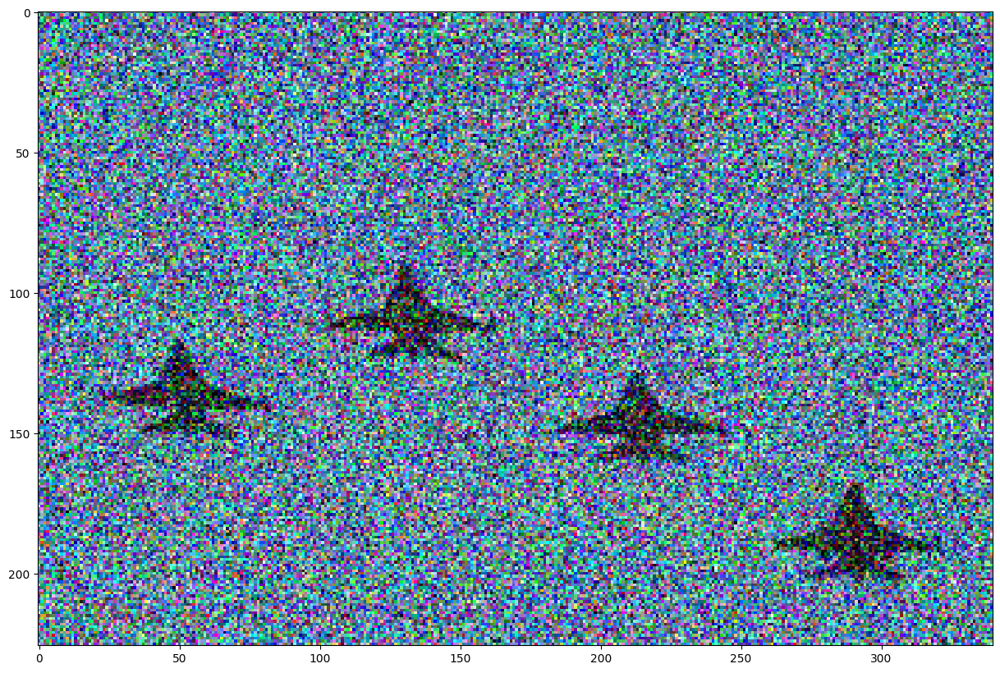

In [8]:
# Loading and displaying the image
#im_planes=io.imread('https://www.dropbox.com/s/ylm0ut8ipu5oonb/avions.png?dl=1')
im_planes=io.imread("https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/planes.png")

plt.figure()
#plt.imshow(im_obs,vmin=0,vmax=255)
plt.rcParams['figure.figsize'] = [15, 15]
plt.imshow(im_planes)
plt.show()


#### Determining the parameters of the classes


Plane class: we can use the values of the rectangle [180:200,280:300].

example 1: np.mean(image[180:200,280:300,1]) returns the average of the selected area for channel 1.

example 2: np.mean(image[180:200,280:300,:], axis=(0, 1)) returns the average over the two first axis (height and width) of the selected area, which is here a np.array of size (3,).

In [9]:
# mean of the plane class - 3D vector
# you can use values in the following square [180:200,280:300]
# TO BE COMPLETED
m_planes = np.mean(im_planes[180:200, 280:300, :], axis=(0, 1))

# mean of the sky class
# you can use values in the following square [0:100,150:300]
# TO BE COMPLETED
m_sky = np.mean(im_planes[:180, :200, :], axis=(0, 1))

print('For the sky, [R,G,B] = ', m_sky)
print("For the planes, [R,G,B] = ", m_planes)

# check that the obtained values are coherent

For the sky, [R,G,B] =  [ 94.04294444 126.01747222 153.71119444]
For the planes, [R,G,B] =  [53.645  56.4725 70.2075]


In [10]:
# Choose a beta value
# TO BE COMPLETED
beta = 20_000.

# TO BE COMPLETED
## Binary graph-cut
# use the previous program to create the graph and compute the cut
# be careful of computing the terminal weights using the 3D values
# you can compute 2 distance images with in each pixel the quadratic
# distance to the mean value of each class

def mincut(img, beta, m0, m1):
    g = maxflow.Graph[float]() # graph instantiation
    
    nodeids = g.add_grid_nodes(img.shape[:2])
    
    g.add_grid_edges(nodeids, beta)
    
    diff0 = np.sum((img - m0) ** 2, axis=-1)
    diff1 = np.sum((img - m1) ** 2, axis=-1)
    g.add_grid_tedges(nodeids, diff0, diff1)

    flow = g.maxflow()
    sgm = g.get_grid_segments(nodeids)
    
    im_bin = np.int_(np.logical_not(sgm))
    return im_bin

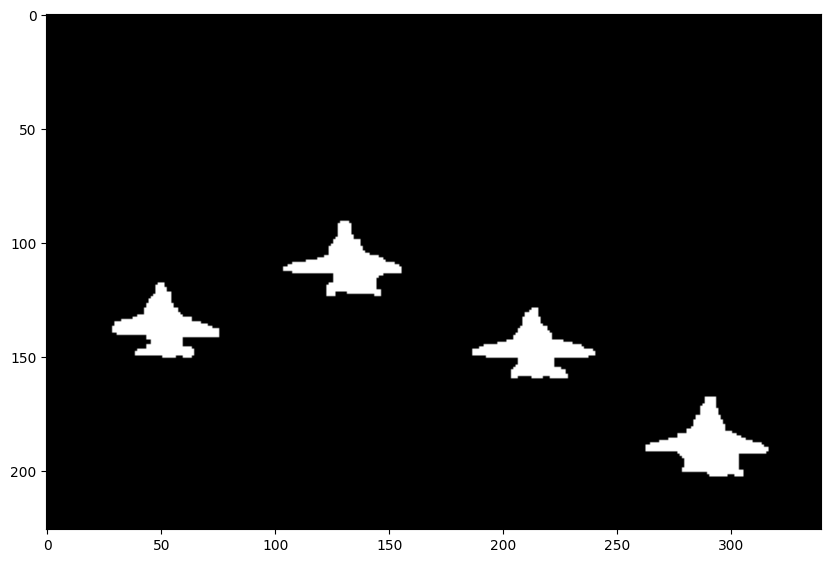

In [11]:
im_bin = mincut(im_planes, beta, m_sky, m_planes)
plt.rcParams['figure.figsize'] = [10, 10]
plt.imshow(im_bin, cmap="gray")

### 2.2 Use of a CRF (Conditional Random Field) model

We will try here to adapt the model used previously to favour transitions where they are compatible with the gradient. To do this, we will replace the constant $\beta$ for the whole image by a "beta_field" which depends on the norm of the gradient.

Q10: Calculate and display the modulus of the gradient of the aircraft image after it has been grayscaled and convolved by a Gaussian kernel of standard deviation 1. Why use the "boundary='symm'" option when convolving through the Sobel filter? Try it without doing the Gaussian filtering. What is the point?

**Your answer &#x270D;**

A10: the `border="symm"` is important to deal with the borders of the image. This options basically mirros the image in the borders to correctly compute the convolution. Without it, the modulus of the gradient in borders is high.

We use the Gaussian filter to minimize the influence of the noise in the modulus of the gradient. Without it, the contours of the planes would not be identified as accurately.

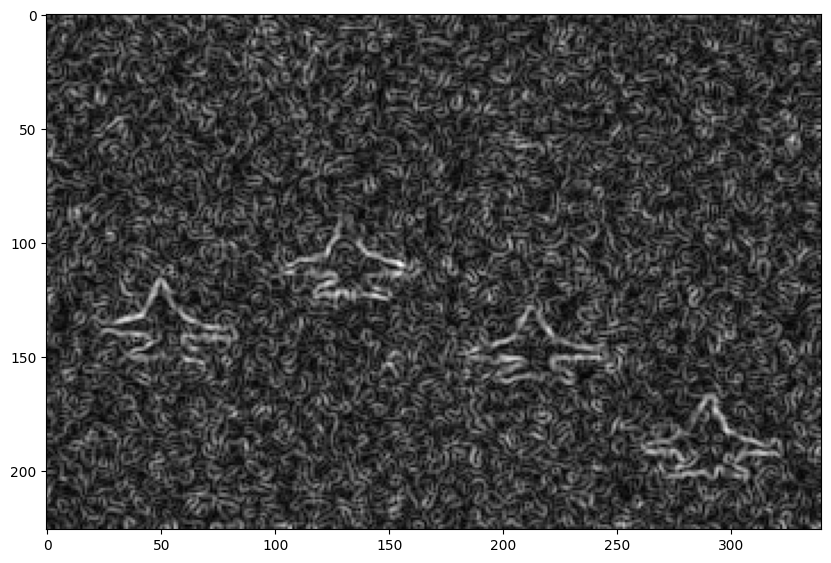

In [12]:
from scipy.signal import convolve2d
import scipy.ndimage
from skimage import color

def gradient(image):
    """ Array -> tuple[Array*Array]"""
    sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype=np.float64)
    sobel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]], dtype=np.float64)
    # to be completed
    # use mode = 'same' and boundary='symm' in scipy.signal.convolve2d
    # TO BE COMPLETED
    derivative_x = convolve2d(image, sobel_x, mode="same", boundary="symm")
    derivative_y = convolve2d(image, sobel_y, mode="same", boundary="symm")
    return([derivative_x,derivative_y])

planes_nb = color.rgb2gray(im_planes)
planes_nb = scipy.ndimage.gaussian_filter(planes_nb, 1)
plane_x, plane_y = gradient(planes_nb)
# calculation of the gradient modulus
# TO BE COMPLETED
grad_av = np.sqrt(plane_x ** 2 + plane_y ** 2)
plt.figure()
plt.imshow(grad_av, cmap="gray")
plt.show()


Complete the code for segmentation by CRF. We will choose $beta\_field=\beta_2\cdot\exp(-grad\_av/h)$. We can use $h=3$ and $\beta_2=20000$. Also replace the constant beta by the field "beta_field" during the "g.add_grid_edges" step.

Q11: Compare the results with and without the contour term.

**Your answer &#x270D;**

A11: It seems the results are quite similar. The biggest difference is in the contours of the planes.

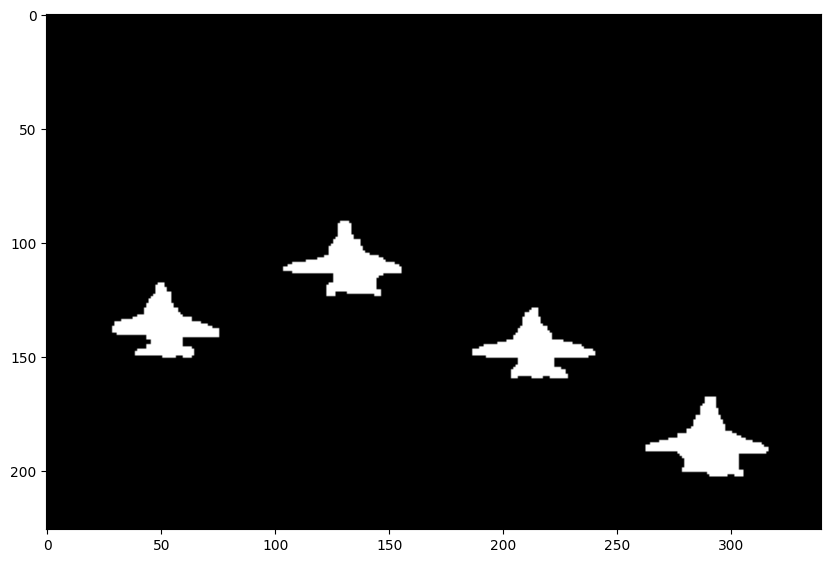

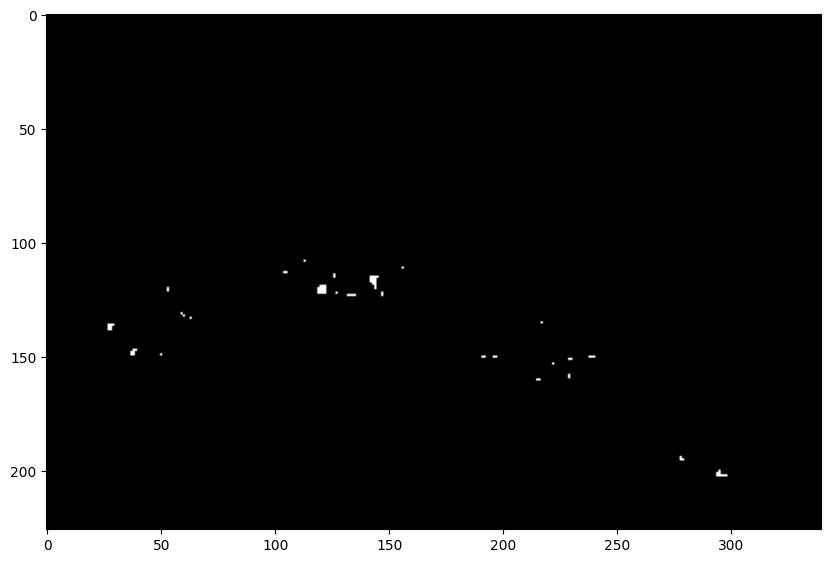

In [13]:
# Calculation of beta_field.
# This field will define the value for 4-neighborhood
# TO BE COMPLETED
h = 3
beta2 = 20_000
beta_field = beta2 * np.exp(- grad_av / h)

# TO BE COMPLETED
## Binary graph-cut
# Complete by replacing beta with beta_field in your previous
# program on the line g.add_grid_edges

im_bin_field = mincut(im_planes, beta_field, m_sky, m_planes)
plt.rcParams['figure.figsize'] = [10, 10]
plt.imshow(im_bin, cmap="gray")
plt.show()
plt.imshow(np.abs(im_bin - im_bin_field), cmap="gray")

## 3. Iterative Segmentation with Gaussian Mixture

Q12: Display the "zebra" image below. Is it possible to segment the zebra with the method used to segment the planes?



**Your answer &#x270D;**

A12: No. The resulting classification cannot take into account the texture of the zebra. It classifies the black part of the zebra as 1 and the grass with the white parts of the zebra as 0.

uint8


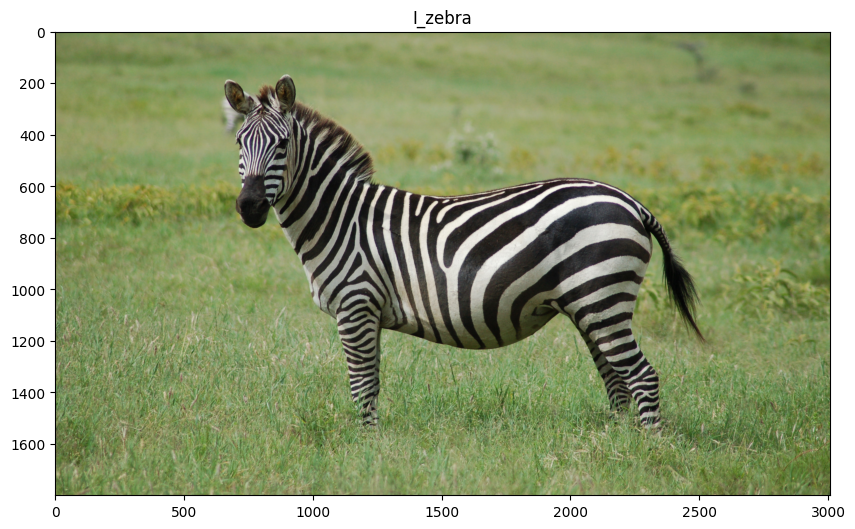

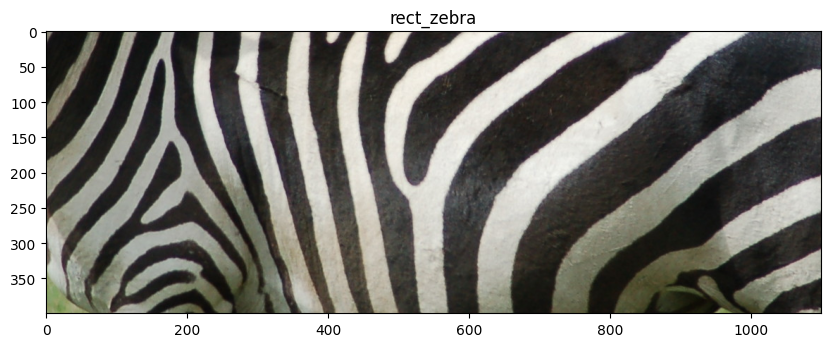

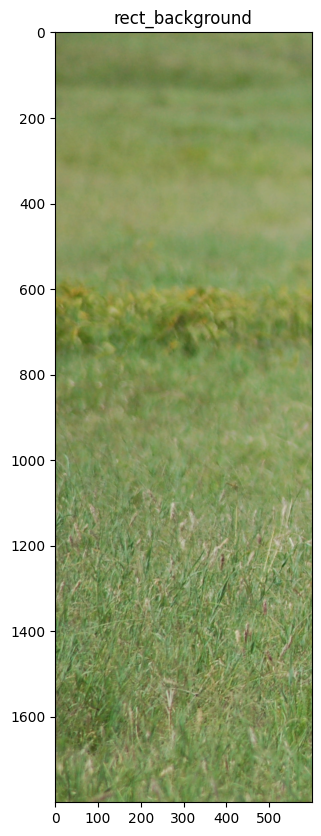

In [14]:
### Loading a new image
I_zebra = io.imread("https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/Equus_quagga.jpg")
I_zebra = I_zebra[200:,:,:]
rect_zebra = I_zebra[700:1100,1000:2100]
rect_background = I_zebra[:,0:600]
print(I_zebra.dtype)

plt.figure()
plt.imshow(I_zebra)
plt.title('I_zebra')
plt.show()

plt.figure()
plt.imshow(rect_zebra)
plt.title('rect_zebra')
plt.show()

plt.figure()
plt.imshow(rect_background)
plt.title('rect_background')
plt.show()

m_zebra = np.mean(rect_zebra, axis=(0, 1))
m_back = np.mean(rect_background, axis=(0, 1))

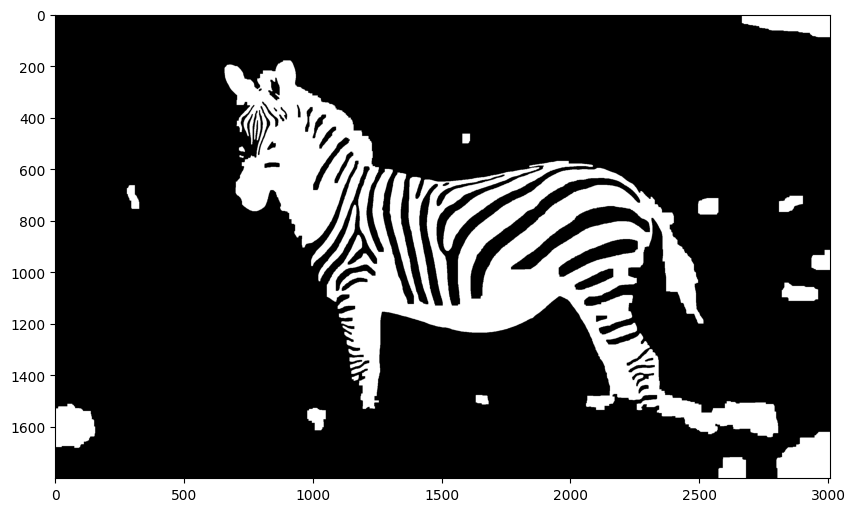

In [15]:
dx, dy = gradient(scipy.ndimage.gaussian_filter(color.rgb2gray(I_zebra), 1))
grad_av = np.sqrt(dx ** 2 + dy ** 2)
h = 3
beta2 = 20_000

im_bin = mincut(I_zebra, beta2 * np.exp(- grad_av / h), m_back, m_zebra)

plt.rcParams['figure.figsize'] = [10, 10]
plt.imshow(im_bin, cmap="gray")

Q13: Calculate the covariance matrix for the rect_zebra and the rect_background. Display the values and comment on the result. What do the diagonal values correspond to?

**Your answer &#x270D;**

A13: The values on the diagonal represent the variances in each color channel. It is easy to see that the background has a smaller variation in the channels (especially green), since it is more or less homogeneous.
The zebra rectangle, on the other hand, has an extremely high variance. This happens because it is composed of black and white stripes.

In [16]:
print(I_zebra.shape)
V_tulip = np.vstack([I_zebra[:,:,i].flatten() for i in range(3)])
print(I_zebra.shape)

M_cov = np.cov(np.vstack([I_zebra[:,:,i].flatten() for i in range(3)]))
print('Full zebra image')
print(M_cov)

M_cov = np.cov(np.vstack([rect_zebra[:,:,i].flatten() for i in range(3)]))
print('Rectangle zebra')
print(M_cov)

M_cov = np.cov(np.vstack([rect_background[:,:,i].flatten() for i in range(3)]))
print('Rectangle background')
print(M_cov)

(1800, 3008, 3)
(1800, 3008, 3)
Full zebra image
[[1505.54438095 1533.04278068 1229.71568017]
 [1533.04278068 1691.10755214 1221.09280991]
 [1229.71568017 1221.09280991 1210.38328951]]
Rectangle zebra
[[5504.73383563 5535.4436469  5290.02896111]
 [5535.4436469  5588.18500866 5329.06646681]
 [5290.02896111 5329.06646681 5143.99751626]]
Rectangle background
[[313.37936128 226.13253307 255.56699124]
 [226.13253307 219.38193629 221.71082516]
 [255.56699124 221.71082516 308.63086939]]


Q14: Display the histogram for the R, G and B channels for the "rect_zebra" image. Comment on the result.

**Your answer &#x270D;**

A14:
We see that all three channels concentrate the occurances in the extremes of the histogram. This is consistent since the black and white stripes represent low values on the three channels (black) or high values in them (white).

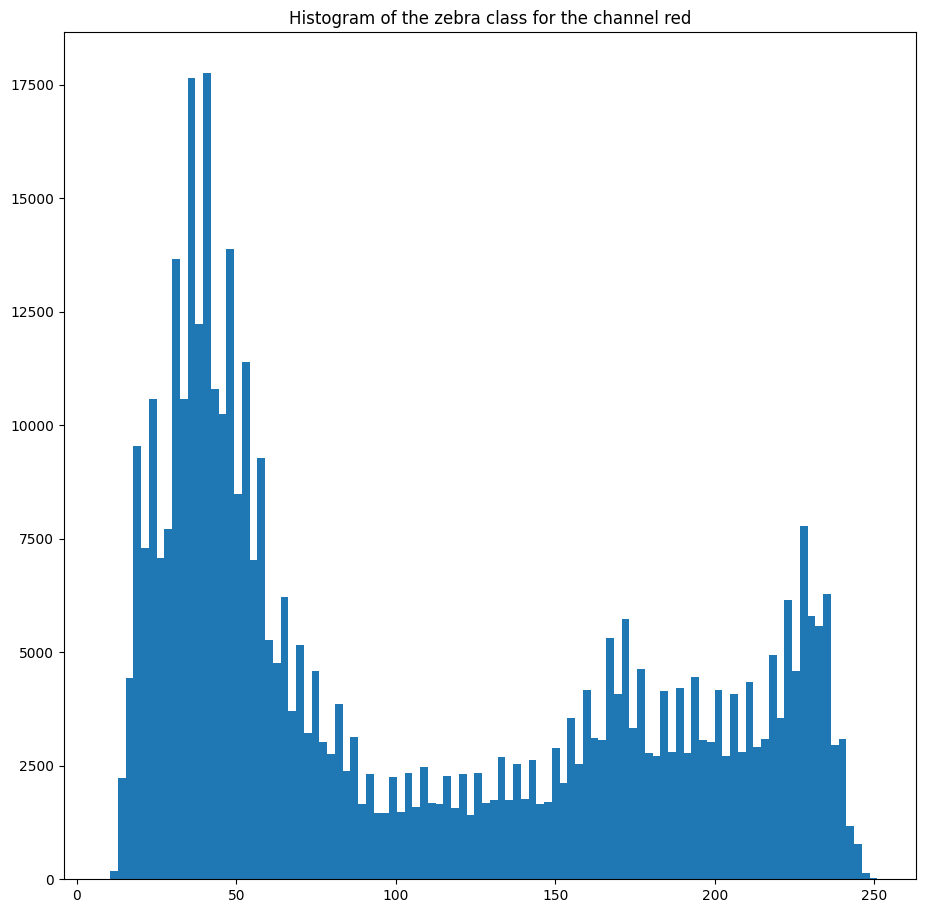

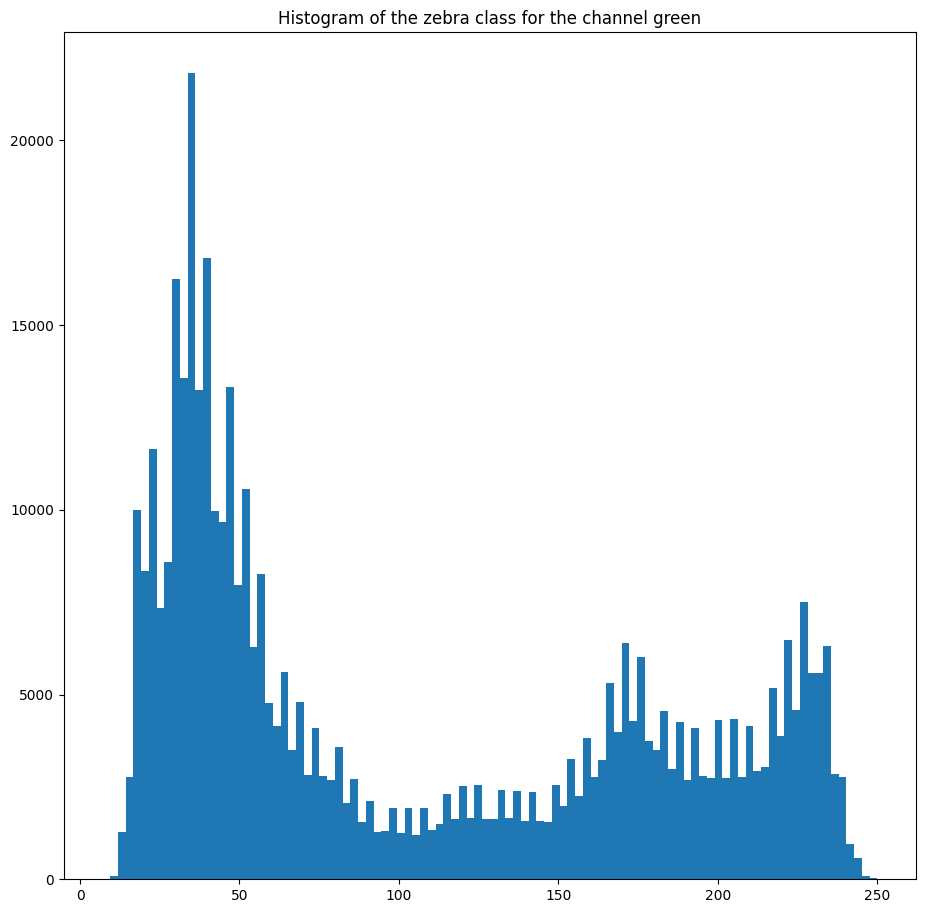

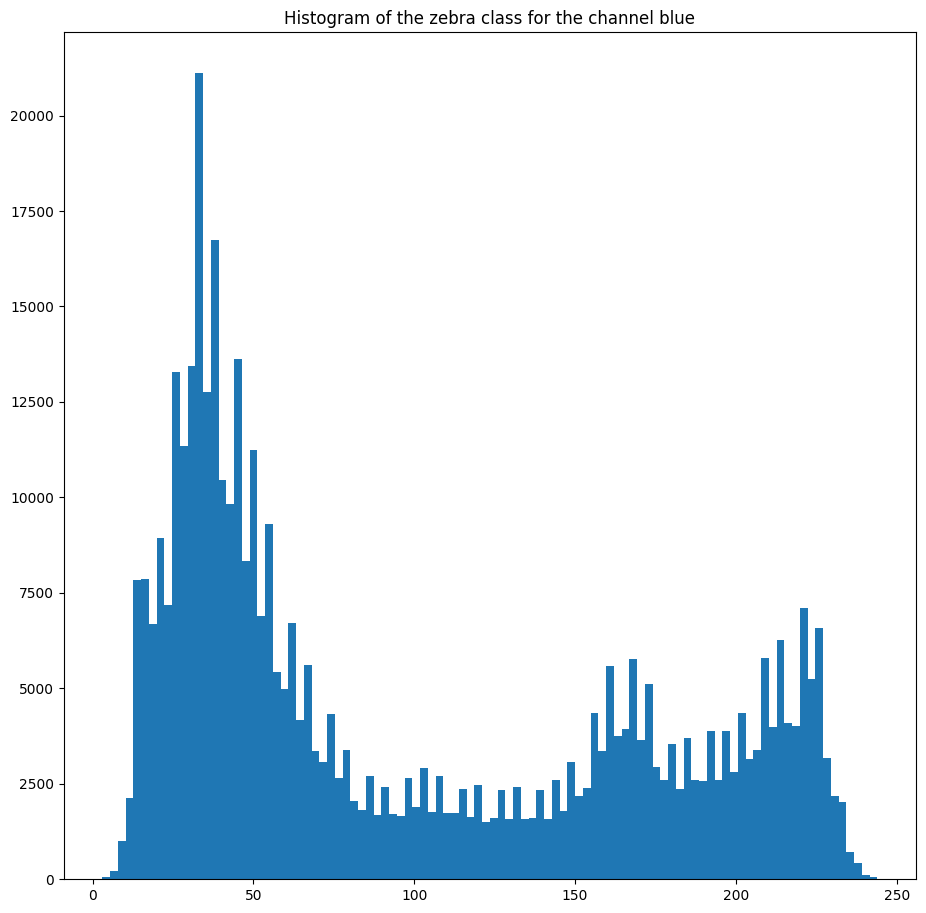

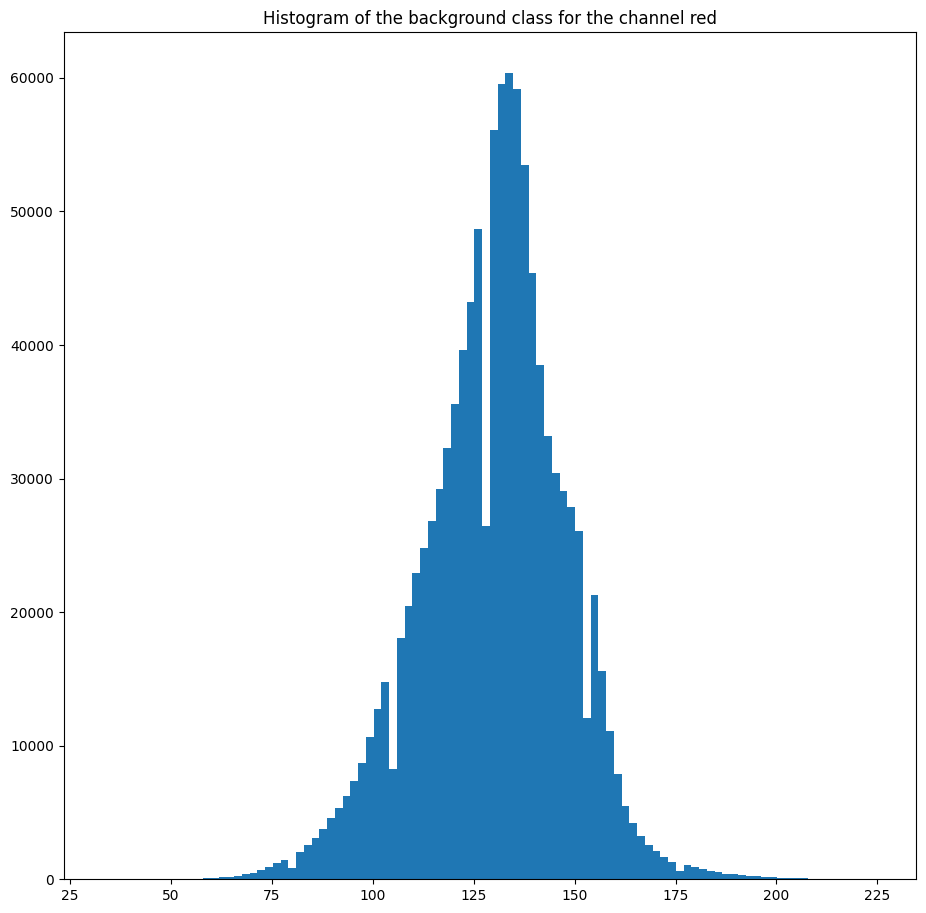

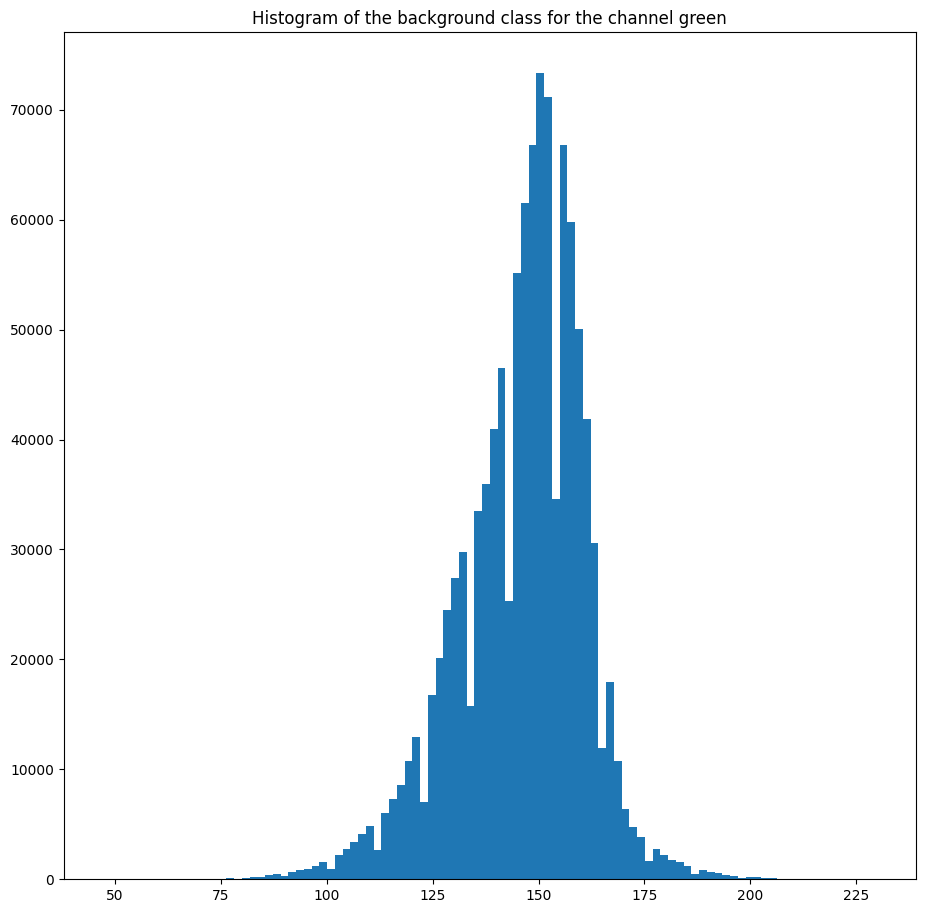

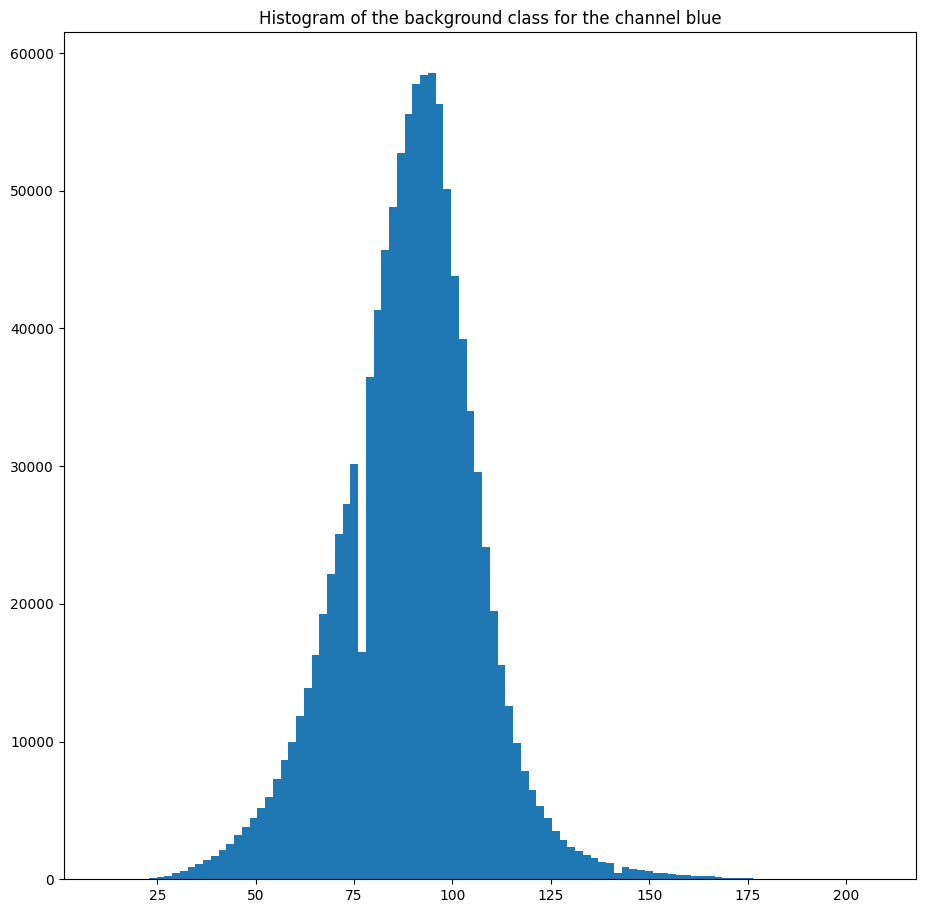

In [17]:
# allows you to change the display size of plt.show
plt.rcParams['figure.figsize'] = [11, 11]

nomchan = ["red","green", "blue"]
for chan in range(3):
    plt.figure()
    plt.hist(rect_zebra[:,:,chan].flatten(),100)
    plt.title("Histogram of the zebra class for the channel " + nomchan[chan])
    plt.show()


for chan in range(3):
    plt.figure()
    plt.hist(rect_background[:,:,chan].flatten(),100)
    plt.title("Histogram of the background class for the channel " + nomchan[chan])
    plt.show()

Q15: Propose an algorithmic method to identify the two classes of the image "rect_zebra". Use a sklearn implementation of this algorithm to identify the mean vectors ($m_R$,$m_G$,$m_B$) for two classes of the "rect_zebra" image and two classes of the "rect_background" image.

*The following line of code can be used to transform the image into a suitable form.*

X = np.vstack([rect_zebra[:,:,i].flatten() for i in range(3)]).transpose()

Comment on the average vectors obtained. They can be displayed as an image using the code provided.

**Your answer &#x270D;**

A15: We can use a K-means clustering in 3 dimensions (3 color channels) to identify the black and white stripes in the rect_zebra image.
For the rect_background, the same algorithm can be used.

In [18]:
# computation of class parameters in a semi-automatic way
from sklearn.cluster import KMeans
import numpy as np

# use a number of classes =2 for the zebra part (complete n_clusters=?)
X = np.vstack([rect_zebra[:,:,i].flatten() for i in range(3)]).transpose()
kmeans_zebra = KMeans(n_clusters=2, random_state=0).fit(X)
mean_vectors_zebra = kmeans_zebra.cluster_centers_

# use a number of classes =2 for the background part
X = np.vstack([rect_background[:,:,i].flatten() for i in range(3)]).transpose()
kmeans_background = KMeans(n_clusters=2, random_state=0).fit(X)
mean_vectors_background = kmeans_background.cluster_centers_

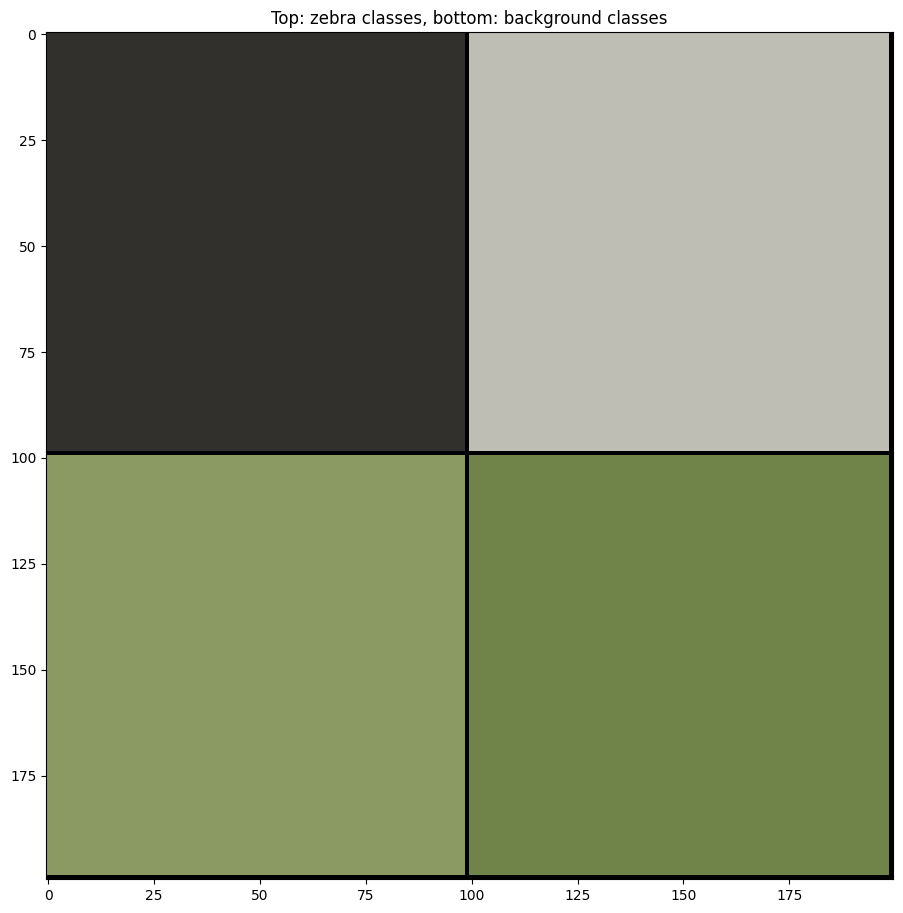

In [19]:
# display of the class centers found as an image
image_mean_vectors = np.zeros((200,200,3),np.uint8)
for i in range(3):
    image_mean_vectors[0:99,0:99,i] = mean_vectors_zebra[0,i]
    image_mean_vectors[0:99,100:199,i] = mean_vectors_zebra[1,i]
    image_mean_vectors[100:199,0:99,i] = mean_vectors_background[0,i]
    image_mean_vectors[100:199,100:199,i] = mean_vectors_background[1,i]

plt.figure()
plt.imshow(image_mean_vectors,vmax = 255)
plt.title("Top: zebra classes, bottom: background classes")
plt.show()

Q16: Display separately two neg-log-likelihood images (the neg-log-likelihood was used as a data attachment in the previous example) for the two zebra classes.
Build a neg-log-likelihood image corresponding to the minimum of the two neg-log-likelihoods of the zebra classes. Similarly for the background class.

Display them and comment.

**Your answer &#x270D;**

A16: We can see that the combined negative log likelihood of the zebra clusterization yields a great result. The algorithm was able to separate the zebra from the rest of the background.

The clusterinzation of the background, however, does not seem to return a good output. Maybe using a single class in the clustarization would make the identification more geared towards the image we are analyzing.

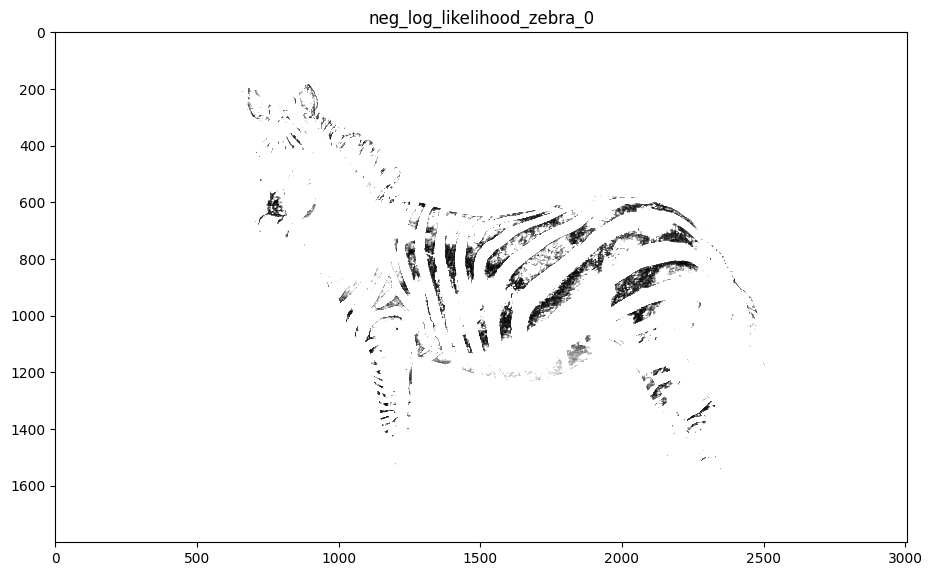

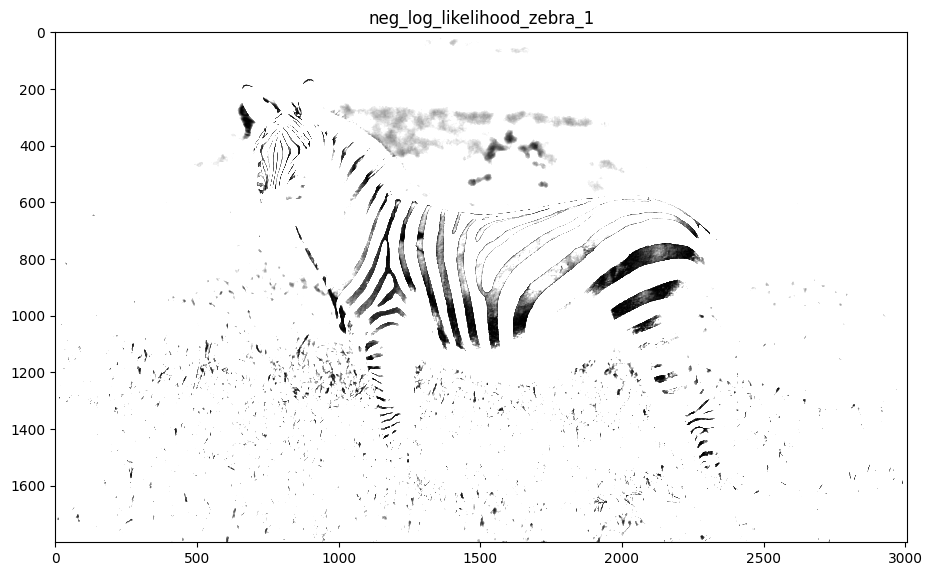

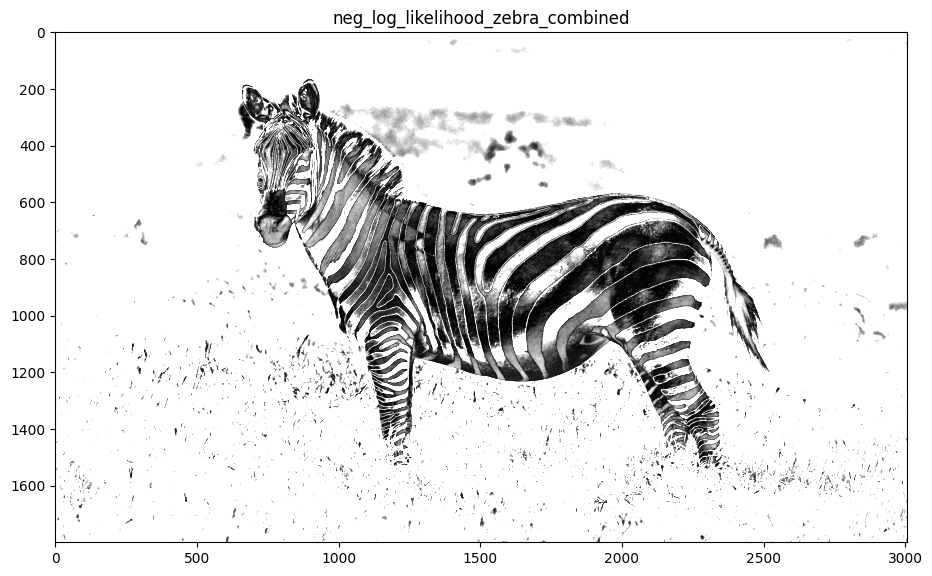

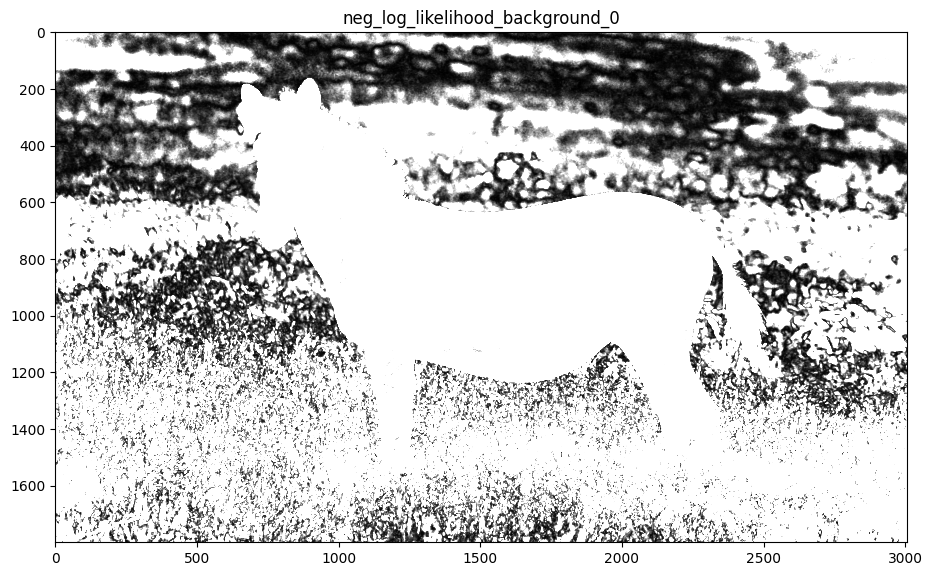

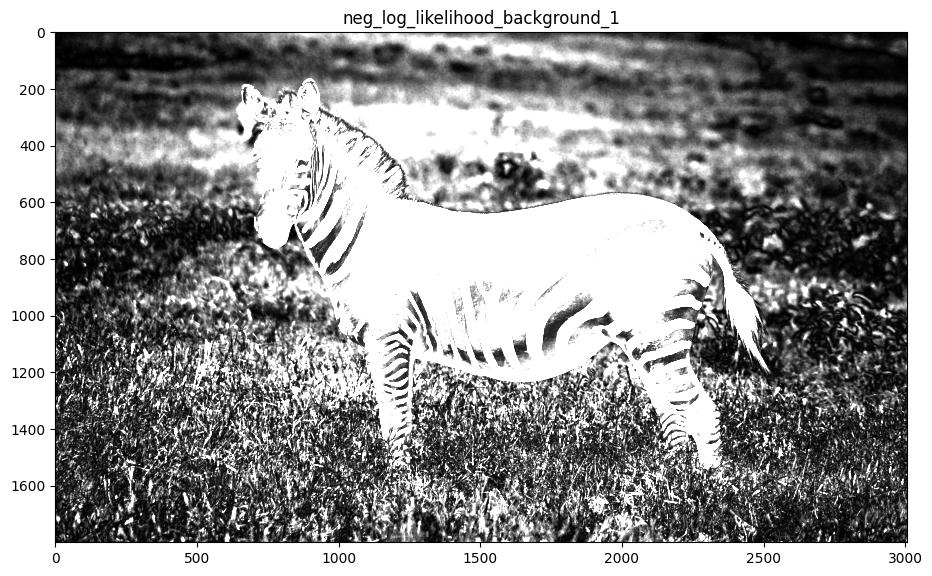

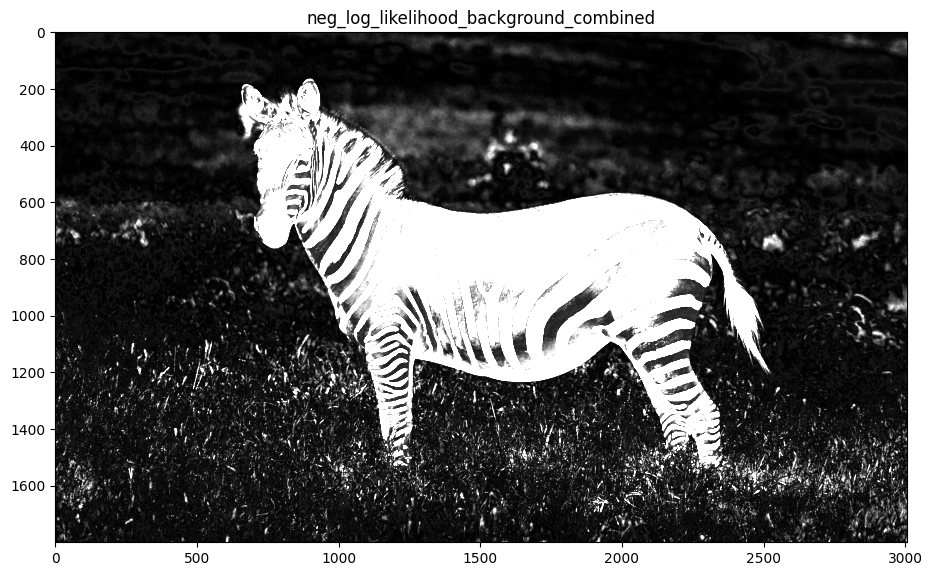

In [20]:
# calculation of the neg-log-likelihood of the zebra class
neg_log_likelihood_zebra_0 = np.sum((I_zebra - mean_vectors_zebra[0]) ** 2, axis=-1)

plt.figure()
plt.imshow(neg_log_likelihood_zebra_0,cmap='gray', vmax = 600)
plt.title("neg_log_likelihood_zebra_0")
plt.show()

neg_log_likelihood_zebra_1 = np.sum((I_zebra - mean_vectors_zebra[1]) ** 2, axis=-1)

plt.figure()
plt.imshow(neg_log_likelihood_zebra_1,cmap='gray', vmax = 5000)
plt.title("neg_log_likelihood_zebra_1")
plt.show()

neg_log_likelihood_zebra_combined = np.minimum(neg_log_likelihood_zebra_0, neg_log_likelihood_zebra_1)

plt.figure()
plt.imshow(neg_log_likelihood_zebra_combined,cmap='gray', vmax = 5000)
plt.title("neg_log_likelihood_zebra_combined")
plt.show()

# TO BE COMPLETED
# calculate the neg-log-likelihood of the background
# call the output neg_log_likelihood_background_combined


neg_log_likelihood_background_0 = np.sum((I_zebra - mean_vectors_background[0]) ** 2, axis=-1)

plt.figure()
plt.imshow(neg_log_likelihood_background_0,cmap='gray', vmax = 600)
plt.title("neg_log_likelihood_background_0")
plt.show()

neg_log_likelihood_background_1 = np.sum((I_zebra - mean_vectors_background[1]) ** 2, axis=-1)

plt.figure()
plt.imshow(neg_log_likelihood_background_1,cmap='gray', vmax = 5000)
plt.title("neg_log_likelihood_background_1")
plt.show()

neg_log_likelihood_background_combined = np.minimum(neg_log_likelihood_background_0, neg_log_likelihood_background_1)

plt.figure()
plt.imshow(neg_log_likelihood_background_combined,cmap='gray', vmax = 5000)
plt.title("neg_log_likelihood_background_combined")
plt.show()


Q17: From these combined data attachment images (one for the background and one for the zebra), set up a graph-cut segmentation of the image with the $\beta$ of your choice. Comment the result.

**Your answer &#x270D;**

A17: We can use the negative log-likelihood as the data fidelity terms for the two classes. Then, with $\beta = 2.4 \times 10^5$, it is possible to correctly identify the zebra in the image. It is important to highlight that the segmentation is not perfect, since the classification of the tail and head regions of the zebra is not completely correct.

Max Flow: 7174340340.954151


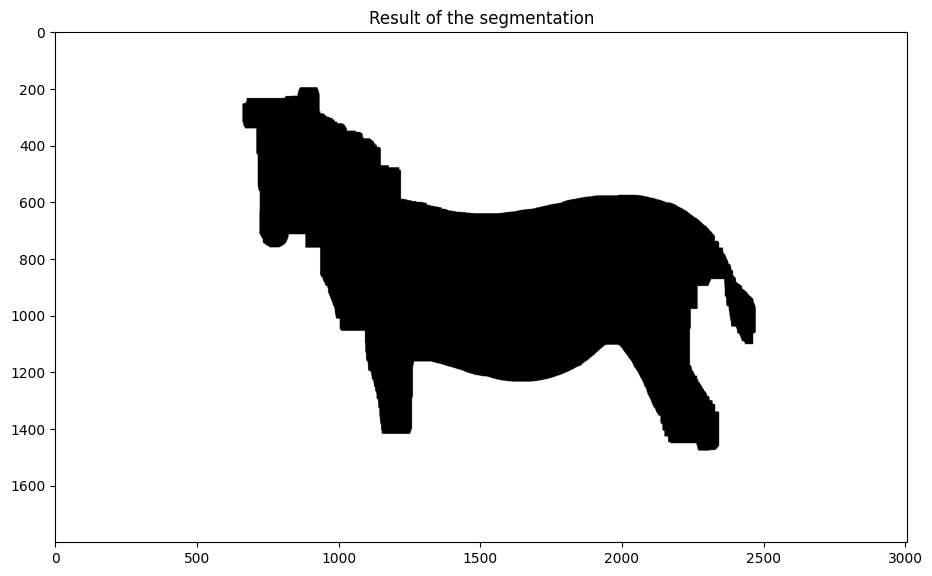

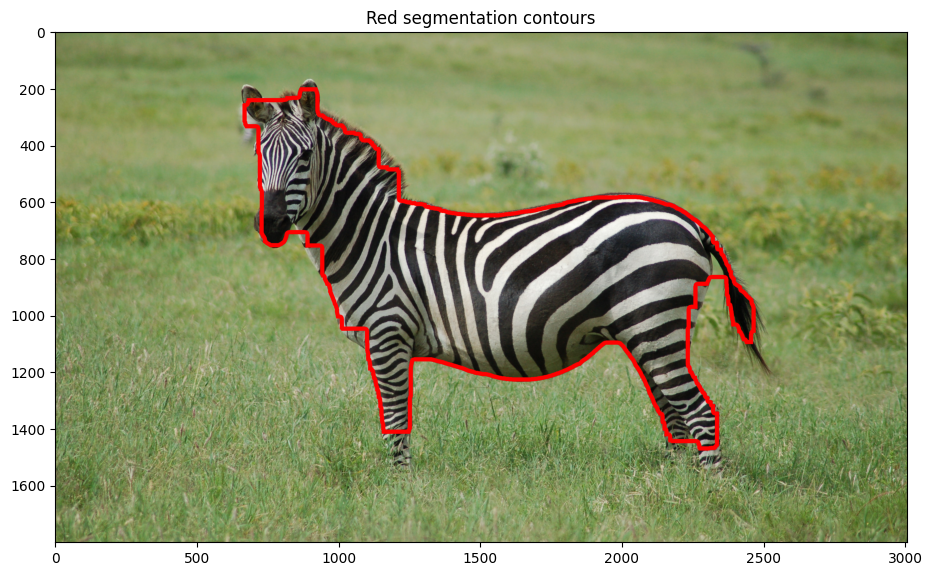

In [21]:
beta = 240_000 # Optimal beta value to be determined

## Binary graph cut

# Create the graph.
g = maxflow.Graph[float]() # Graph instantiation
# Add the nodes. nodeids has the identifiers of the nodes in the grid.
nodeids = g.add_grid_nodes(I_zebra.shape[:2]) # Create a grid with a non-terminal node for each pixel in the image
# Add non-terminal edges with the same capacity.
g.add_grid_edges(nodeids, beta) # Addition of a beta weight edge between each adjacent node according to the 4-connexity
# Add the terminal edges.

# TO BE COMPLETED
g.add_grid_tedges(nodeids, neg_log_likelihood_zebra_combined, neg_log_likelihood_background_combined)


# Find the maximum flow.
flow = g.maxflow()

print("Max Flow:", str(flow))
# Get the segments of the nodes in the grid.
sgm = g.get_grid_segments(nodeids)
im_bin = np.int_(np.logical_not(sgm))

plt.figure()
plt.imshow(im_bin, cmap="gray")
plt.title("Result of the segmentation")
plt.show()

plt.figure()
plt.imshow(display_segmentation_borders(I_zebra, im_bin), cmap="gray")
plt.title("Red segmentation contours")
plt.show()

Q18: From the obtained segmentation, determine the mean vectors for 5 classes for the background and 5 classes for the zebra. Use these lists of mean vectors to construct new neg-log-likelihood combination images. Comment on them.

**Your answer &#x270D;**

A18: The higher number of classes makes the segmentation more accurate. We can see in the combined neg-log-likelihood that the zebra is correctly highlighted, even the ares that were now well-behaved in the previous cells.

In [22]:
# The computing of this cell can take several minutes.

X_1 = np.vstack([I_zebra[im_bin==1,i].flatten() for i in range(3)]).transpose()
kmeans_zebra2 = KMeans(n_clusters=5, random_state=0).fit(X_1)
mean_vectors_zebra2 = kmeans_zebra2.cluster_centers_

X_2 = np.vstack([I_zebra[im_bin==0,i].flatten() for i in range(3)]).transpose()
kmeans_background2 = KMeans(n_clusters=5, random_state=0).fit(X_2)
mean_vectors_background2 = kmeans_background2.cluster_centers_

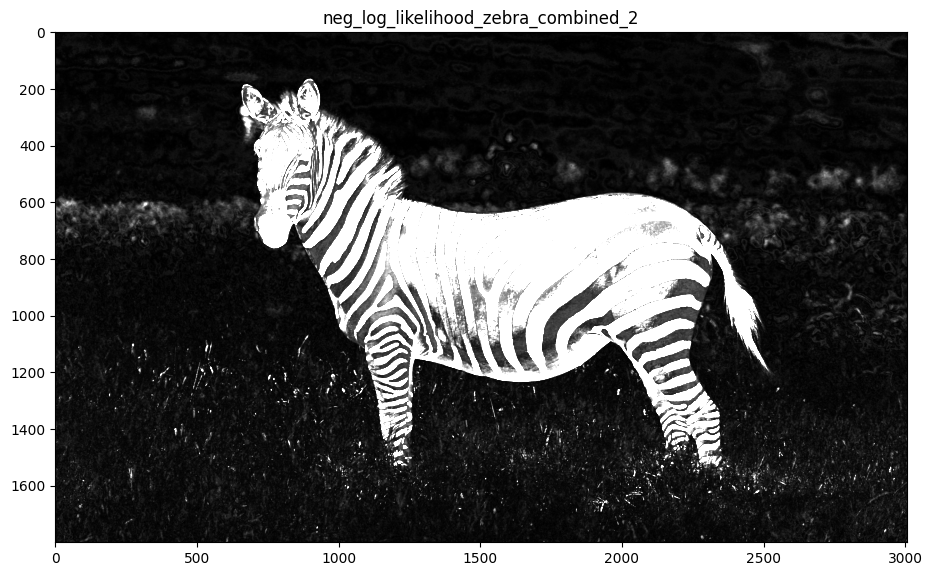

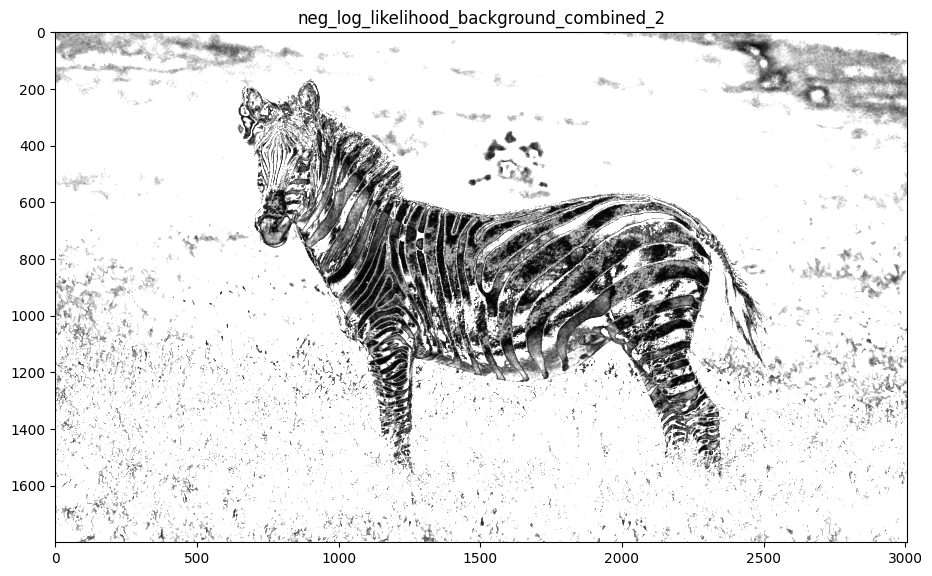

In [23]:
neg_log_likelihood_zebra_combined_2 = np.amin(np.dstack([(sum((I_zebra[:,:,i]-mean_vectors_zebra2[n_cl,i])**2 for i in range(3))) for n_cl in range(len(mean_vectors_zebra2))]),2)

neg_log_likelihood_background_combined_2 = np.amin(np.dstack([(sum((I_zebra[:,:,i]-mean_vectors_background2[n_cl,i])**2 for i in range(3))) for n_cl in range(len(mean_vectors_background2))]),2)

plt.figure()
plt.imshow(neg_log_likelihood_zebra_combined_2 ,cmap='gray', vmax = 3000)
plt.title("neg_log_likelihood_zebra_combined_2")
plt.show()

plt.figure()
plt.imshow(neg_log_likelihood_background_combined_2,cmap='gray', vmax = 1000)
plt.title("neg_log_likelihood_background_combined_2")
plt.show()


Q19: From these neg-log-likelihood images, segment the image by graph-cut using a new value of $\beta$ that gives you the best result. Comment on the result and the new value of $\beta$ that allowed you to obtain it. What about the new 5-class data attachment compared to the previous one?

**Your answer &#x270D;**

A19: The optimal $\beta$ found is $\beta = 12000$. It is possible to see that the result accurately and almost perfectly identifies the zebra in the image.
The classification with 5 classes in the K means algorithm allows us to get to the solution much faster and with a $\beta$ way smaller.

Max Flow: 1453473304.9258451


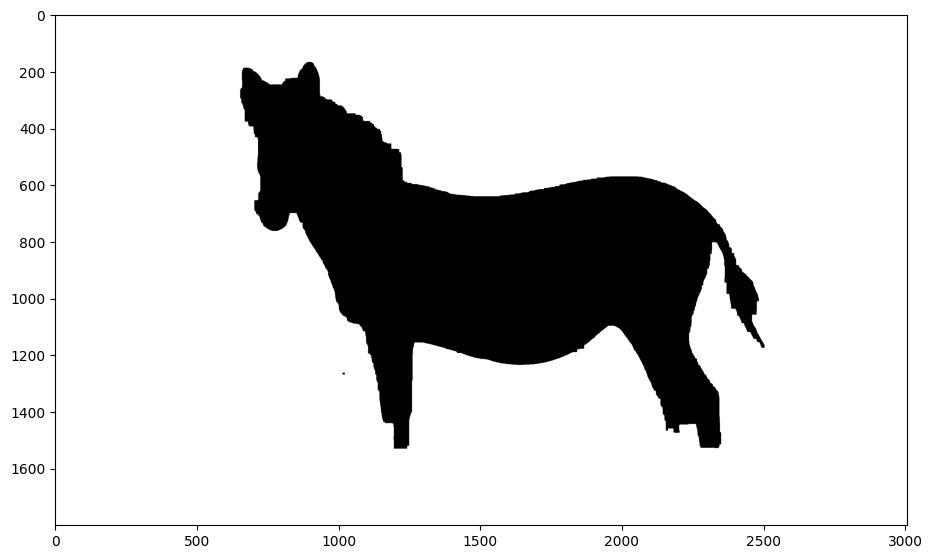

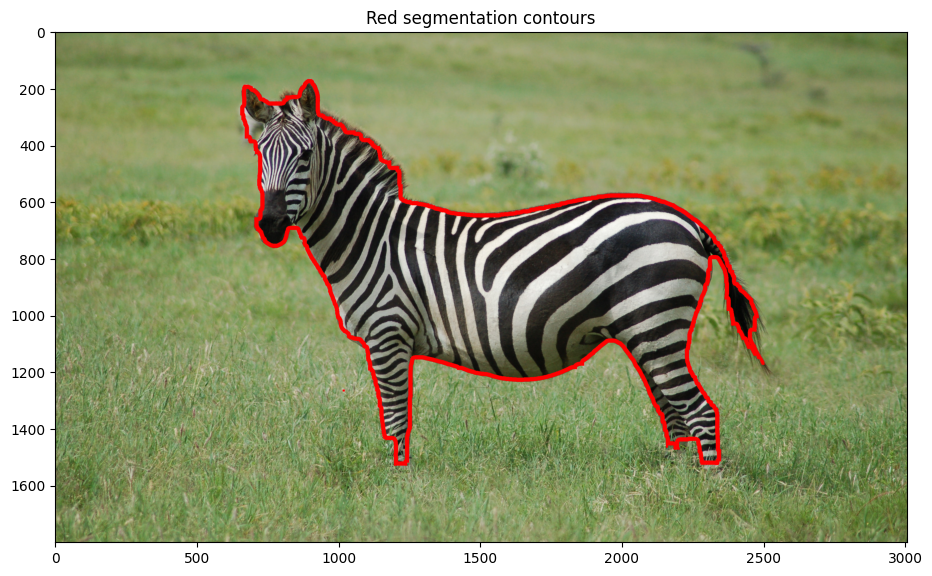

In [24]:
beta = 12000 # Optimal beta value to be determined

g = maxflow.Graph[float]() # Graph instantiation
# Add the nodes. nodeids has the identifiers of the nodes in the grid.
nodeids = g.add_grid_nodes(I_zebra.shape[:2])
# Add non-terminal edges with the same capacity.
g.add_grid_edges(nodeids, beta)
# Add the terminal edges.
g.add_grid_tedges(nodeids, neg_log_likelihood_background_combined_2, neg_log_likelihood_zebra_combined_2)

flow = g.maxflow()

print("Max Flow:", str(flow))
# Get the segments of the nodes in the grid.
sgm = g.get_grid_segments(nodeids) # Returns 1 if the pixel is on the drain side after calculation of the min cut, 0 if it is on the source side
im_bin = np.int_(np.logical_not(sgm))

plt.figure()
plt.imshow(im_bin, cmap="gray")
plt.show()

plt.figure()
plt.imshow(display_segmentation_borders(I_zebra, im_bin), cmap="gray")
plt.title("Red segmentation contours")
plt.show()